In [1]:
# Copyright (c) Meta Platforms, Inc. and affiliates.

# Video segmentation with SAM 2

This notebook shows how to use SAM 2 for interactive segmentation in videos. It will cover the following:

- adding clicks (or box) on a frame to get and refine _masklets_ (spatio-temporal masks)
- propagating clicks (or box) to get _masklets_ throughout the video
- segmenting and tracking multiple objects at the same time

We use the terms _segment_ or _mask_ to refer to the model prediction for an object on a single frame, and _masklet_ to refer to the spatio-temporal masks across the entire video. 

该notbook展示了如何使用 SAM 2 进行视频中的交互式分割。它将涵盖以下内容：

- 在帧上添加点击（或框）以获取和细化 _masklets_（时空掩码）
- 传播点击（或框）以在整个视频中获取 _masklets_
- 同时分割和跟踪多个对象

我们使用术语 _segment_ 或 _mask_ 来指代模型对单帧上对象的预测，使用 _masklet_ 来指代整个视频中的时空掩码。

<a target="_blank" href="https://colab.research.google.com/github/facebookresearch/segment-anything-2/blob/main/notebooks/video_predictor_example.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

## Environment Set-up

If running locally using jupyter, first install `segment-anything-2` in your environment using the [installation instructions](https://github.com/facebookresearch/segment-anything-2#installation) in the repository.

If running from Google Colab, set `using_colab=True` below and run the cell. In Colab, be sure to select 'GPU' under 'Edit'->'Notebook Settings'->'Hardware accelerator'. Note that it's recommended to use **A100 or L4 GPUs when running in Colab** (T4 GPUs might also work, but could be slow and might run out of memory in some cases).

如果在本地使用 Jupyter 运行，请首先按照仓库中的安装说明在您的环境中安装 segment-anything-2。

如果在 Google Colab 上运行，请在下面设置 using_colab=True 并运行该单元格。在 Colab 中，请务必在“编辑”->“笔记本设置”->“硬件加速器”下选择“GPU”。请注意，建议在 Colab 中使用 A100 或 L4 GPU（T4 GPU 也可能可行，但可能速度较慢，并且在某些情况下可能会出现内存不足的情况）。

In [1]:
using_colab = False

In [2]:
if using_colab:
    import torch
    import torchvision
    print("PyTorch version:", torch.__version__)
    print("Torchvision version:", torchvision.__version__)
    print("CUDA is available:", torch.cuda.is_available())
    import sys
    !{sys.executable} -m pip install opencv-python matplotlib
    !{sys.executable} -m pip install 'git+https://github.com/facebookresearch/segment-anything-2.git'

    !mkdir -p videos
    !wget -P videos https://dl.fbaipublicfiles.com/segment_anything_2/assets/bedroom.zip
    !unzip -d videos videos/bedroom.zip

    !mkdir -p ../checkpoints/
    !wget -P ../checkpoints/ https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_large.pt

## Set-up

In [3]:
import os
# 如果使用 Apple MPS，对于不支持的操作，可以回退到 CPU。
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"
import numpy as np
import torch
import matplotlib.pyplot as plt
from PIL import Image

In [4]:
# 选择计算设备
if torch.cuda.is_available():
    device = torch.device("cuda")
elif torch.backends.mps.is_available():
    device = torch.device("mps")
else:
    device = torch.device("cpu")
print(f"using device: {device}")

if device.type == "cuda":
    # 对整个笔记本使用 bfloat16 数据类型
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # 对于 Ampere GPU (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True
elif device.type == "mps":
    print(
        "\nSupport for MPS devices is preliminary. SAM 2 is trained with CUDA and might "
        "give numerically different outputs and sometimes degraded performance on MPS. "
        "See e.g. https://github.com/pytorch/pytorch/issues/84936 for a discussion."
    )

using device: cuda


### Loading the SAM 2 video predictor

In [5]:
from sam2.build_sam import build_sam2_video_predictor

sam2_checkpoint = "../checkpoints/sam2_hiera_large.pt"
model_cfg = "sam2_hiera_l.yaml"

predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

In [6]:
def show_mask(mask, ax, obj_id=None, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        cmap = plt.get_cmap("tab10")
        cmap_idx = 0 if obj_id is None else obj_id
        color = np.array([*cmap(cmap_idx)[:3], 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)


def show_points(coords, labels, ax, marker_size=200):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)


def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0, 0, 0, 0), lw=2))

#### Select an example video

We assume that the video is stored as a list of JPEG frames with filenames like `<frame_index>.jpg`.

For your custom videos, you can extract their JPEG frames using ffmpeg (https://ffmpeg.org/) as follows:
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
where `-q:v` generates high-quality JPEG frames and `-start_number 0` asks ffmpeg to start the JPEG file from `00000.jpg`.

我们假设视频被存储为 JPEG 帧列表，文件名格式为 <frame_index>.jpg。

对于您的自定义视频，您可以使用 ffmpeg (https://ffmpeg.org/) 提取其 JPEG 帧，方法如下：
```
ffmpeg -i <your_video>.mp4 -q:v 2 -start_number 0 <output_dir>/'%05d.jpg'
```
其中，-q:v 用于生成高质量的 JPEG 帧，而 -start_number 0 告诉 ffmpeg 从 00000.jpg 开始生成 JPEG 文件。

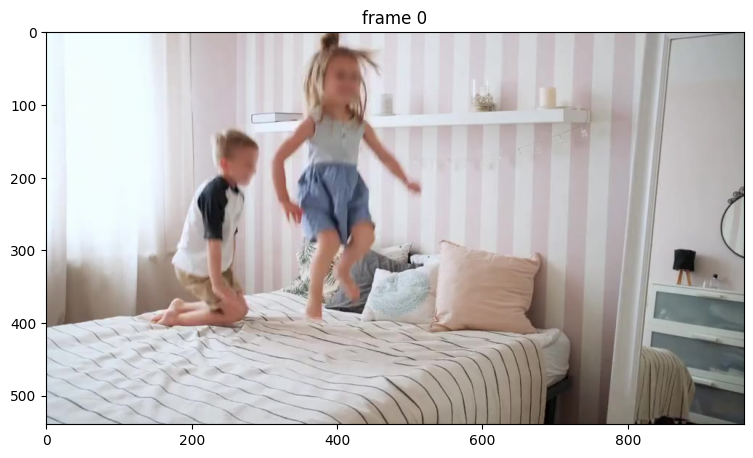

In [7]:
# `video_dir` 是一个包含 JPEG 帧的目录，这些帧的文件名格式为 `<frame_index>.jpg`。
video_dir = "./videos/bedroom"

# 扫描指定目录中的所有 JPEG 帧文件名
frame_names = [
    p for p in os.listdir(video_dir)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))

# 查看第一帧视频画面
frame_idx = 0
plt.figure(figsize=(9, 6))
plt.title(f"frame {frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[frame_idx])))

#### Initialize the inference state

SAM 2 requires stateful inference for interactive video segmentation, so we need to initialize an **inference state** on this video.

During initialization, it loads all the JPEG frames in `video_path` and stores their pixels in `inference_state` (as shown in the progress bar below).

SAM 2 需要有状态的推理来进行交互式视频分割，因此我们需要在这个视频上初始化一个推理状态。

在初始化过程中，它会加载 video_path 中的所有 JPEG 帧，并将它们的像素存储在 inference_state 中（如下方的进度条所示）。

In [8]:
inference_state = predictor.init_state(video_path=video_dir)

frame loading (JPEG): 100%|██████████| 200/200 [00:10<00:00, 18.84it/s]


### Example 1: Segment & track one object

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

(The cell below is just for illustration; it's not needed to call `reset_state` here as this `inference_state` is just freshly initialized above.)

注意：如果您之前已经使用过此 inference_state 进行任何跟踪，请先通过 reset_state 重置它。

（下方的单元格只是用于演示；在此处不需要调用 reset_state，因为这个 inference_state 刚刚在上方初始化。）

In [9]:
predictor.reset_state(inference_state)

#### Step 1: Add a first click on a frame

To get started, let's try to segment the child on the left.

Here we make a **positive click** at (x, y) = (210, 350) with label `1`, by sending their coordinates and labels into the `add_new_points_or_box` API.

Note: label `1` indicates a *positive click (to add a region)* while label `0` indicates a *negative click (to remove a region)*.

首先，我们尝试分割左边的孩子。

在此，我们在 (x, y) = (210, 350) 位置进行一次正向点击，标签为 1，通过将它们的坐标和标签传递给 add_new_points_or_box API。

注意：标签 1 表示正向点击（添加区域），而标签 0 表示负向点击（移除区域）。

/root/segment-anything-2/sam2/sam2_video_predictor.py:873: UserWarning: /root/segment-anything-2/sam2/_C.so: undefined symbol: _ZN3c1015SmallVectorBaseIjE8grow_podEPKvmm

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/segment-anything-2/blob/main/INSTALL.md).
  pred_masks_gpu = fill_holes_in_mask_scores(


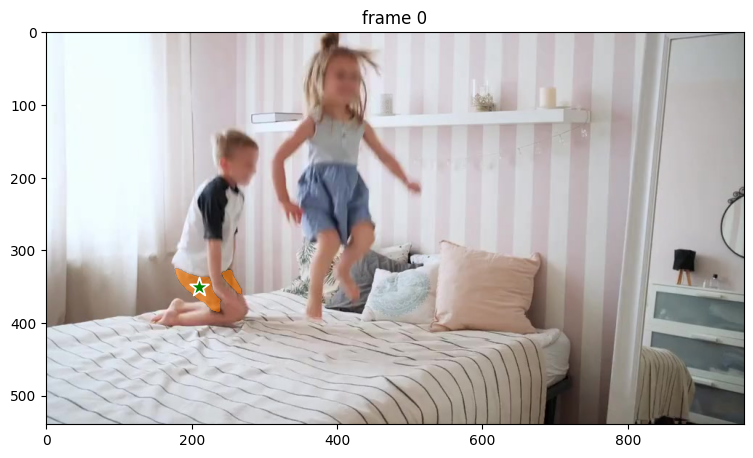

In [10]:
ann_frame_idx = 0  # 我们进行交互的帧索引
ann_obj_id = 1  # 为我们进行交互的每个对象分配一个唯一的 ID（可以是任意整数）

# 我们首先在 (x, y) = (210, 350) 位置添加一个正向点击
points = np.array([[210, 350]], dtype=np.float32)
# 对于标签，`1` 表示正向点击，`0` 表示负向点击
labels = np.array([1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# 在当前（交互的）帧上显示结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

#### Step 2: Add a second click to refine the prediction

Hmm, it seems that although we wanted to segment the child on the left, the model predicts the mask for only the shorts -- this can happen since there is ambiguity from a single click about what the target object should be. We can refine the mask on this frame via another positive click on the child's shirt.

Here we make a **second positive click** at (x, y) = (250, 220) with label `1` to expand the mask.

Note: we need to send **all the clicks and their labels** (i.e. not just the last click) when calling `add_new_points_or_box`.


嗯，看来虽然我们想分割左边的孩子，但模型只预测了短裤的掩码——这种情况可能会发生，因为单次点击可能会让目标对象不明确。我们可以通过在孩子的衬衫上再进行一次正向点击来细化这一帧上的掩码。

在此，我们在 (x, y) = (250, 220) 位置进行第二次正向点击，标签为 1，以扩大掩码范围。

注意：在调用 add_new_points_or_box 时，我们需要传递所有点击及其标签（即不仅仅是最后一次点击）。

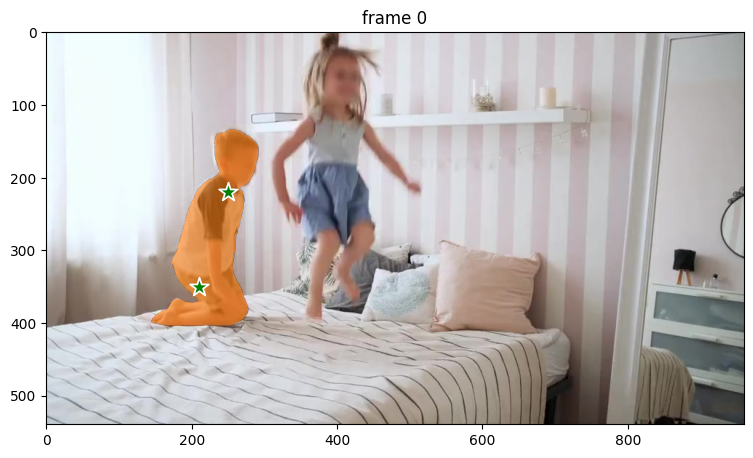

In [11]:
ann_frame_idx = 0  # 我们进行交互的帧索引
ann_obj_id = 1  # 为我们进行交互的每个对象分配一个唯一的 ID（可以是任意整数）

# 现在在 (x, y) = (250, 220) 位置添加第二次正向点击以细化掩码
# 将所有点击（及其标签）发送到 `add_new_points_or_box`
points = np.array([[210, 350], [250, 220]], dtype=np.float32)
# 对于标签，`1` 表示正向点击，`0` 表示负向点击
labels = np.array([1, 1], np.int32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# 在当前（交互的）帧上显示结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

With this 2nd refinement click, now we get a segmentation mask of the entire child on frame 0.

通过这第二次细化点击，我们现在在帧 0 上获得了整个孩子的分割掩码。

#### Step 3: Propagate the prompts to get the masklet across the video

To get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

要在整个视频中获取时空掩码，我们需要使用 propagate_in_video API 传播提示。

propagate in video: 100%|██████████| 200/200 [00:08<00:00, 23.69it/s]


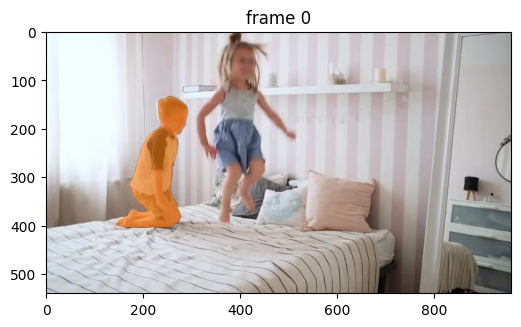

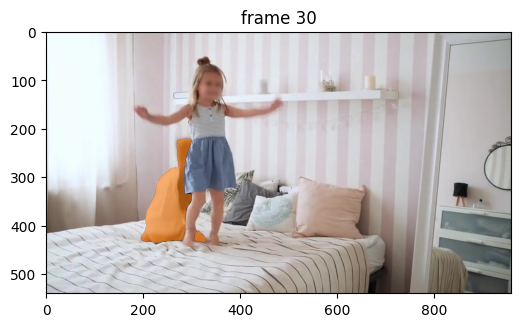

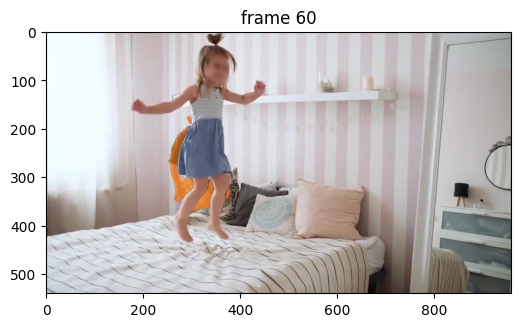

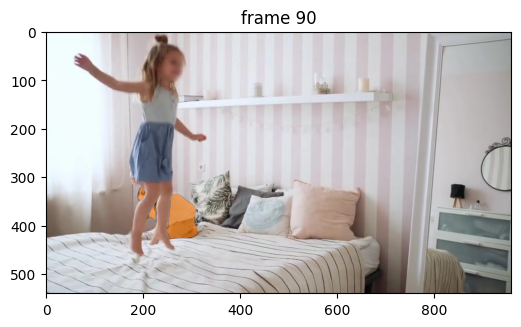

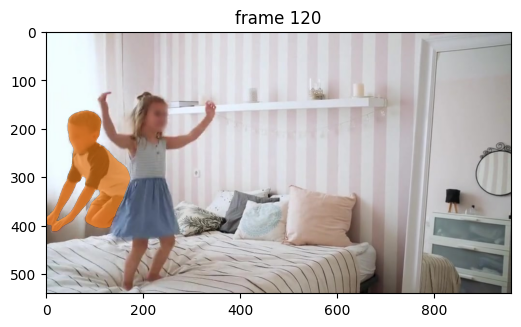

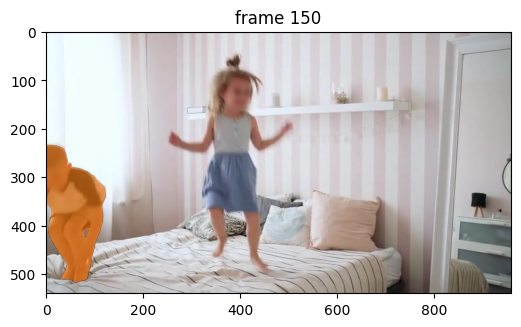

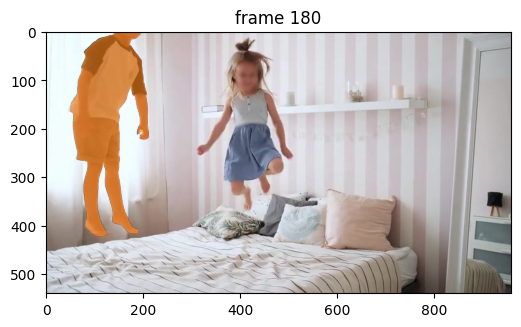

In [12]:
# 在整个视频中运行传播，并将结果收集到一个字典中
video_segments = {}  # video_segments 包含逐帧的分割结果
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# 每隔几帧渲染一次分割结果
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

#### Step 4: Add new prompts to further refine the masklet

It appears that in the output masklet above, there are some imperfections in boundary details on frame 150.

With SAM 2 we can fix the model predictions interactively. We can add a **negative click** at (x, y) = (82, 415) on this frame with label `0` to refine the masklet. Here we call the `add_new_points_or_box` API with a different `frame_idx` argument to indicate the frame index we want to refine.

在上面的输出时空掩码中，帧 150 的边界细节似乎存在一些瑕疵。

使用 SAM 2，我们可以交互式地修正模型预测。我们可以在此帧 (x, y) = (82, 415) 位置添加一个负向点击，标签为 0，以细化时空掩码。在这里，我们调用 add_new_points_or_box API，并使用不同的 frame_idx 参数来指示我们要细化的帧索引。

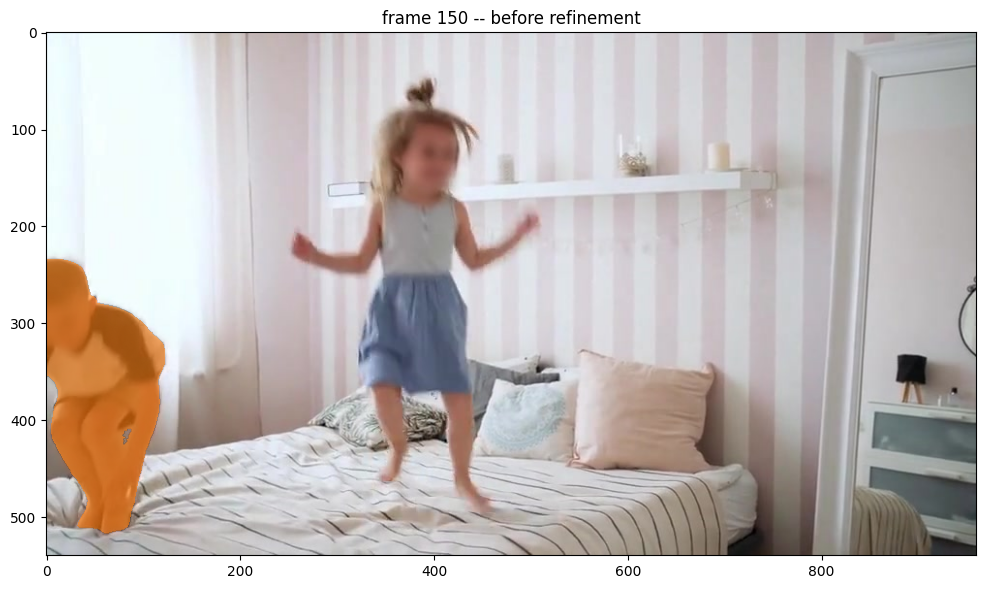

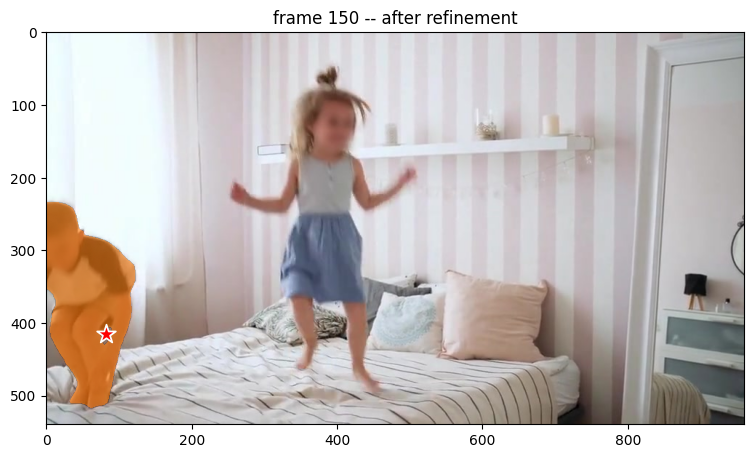

In [13]:
ann_frame_idx = 150  # 进一步细化该帧的一些细节
ann_obj_id = 1  # 为我们交互的对象分配一个唯一的 ID（可以是任意整数）

# 显示进一步细化前的分割结果
plt.figure(figsize=(12, 8))
plt.title(f"frame {ann_frame_idx} -- before refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_mask(video_segments[ann_frame_idx][ann_obj_id], plt.gca(), obj_id=ann_obj_id)

# 在该帧 (x, y) = (82, 415) 位置添加一次负向点击以细化分割
points = np.array([[82, 415]], dtype=np.float32)
# 对于标签，`1` 表示正向点击，`0` 表示负向点击
labels = np.array([0], np.int32)
_, _, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# 显示进一步细化后的分割结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx} -- after refinement")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
show_mask((out_mask_logits > 0.0).cpu().numpy(), plt.gca(), obj_id=ann_obj_id)

#### Step 5: Propagate the prompts (again) to get the masklet across the video

Let's get an updated masklet for the entire video. Here we call `propagate_in_video` again to propagate all the prompts after adding the new refinement click above.

让我们获取更新后的整个视频时空掩码。在这里，我们再次调用 propagate_in_video 来传播所有提示，以便在添加了新的细化点击后更新掩码。

propagate in video: 100%|██████████| 200/200 [00:08<00:00, 24.23it/s]


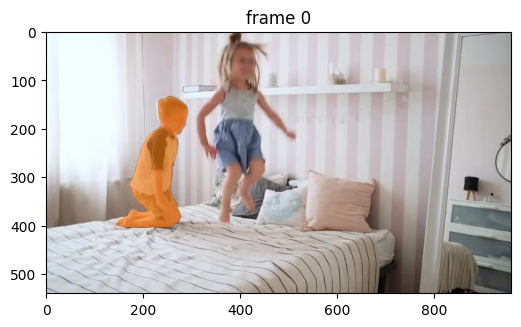

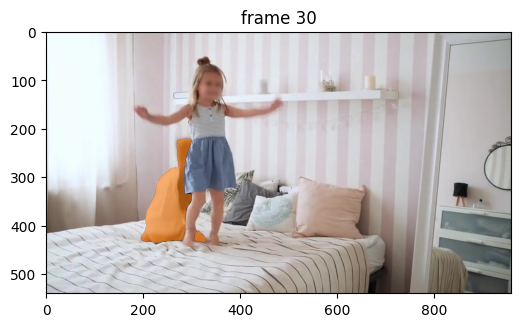

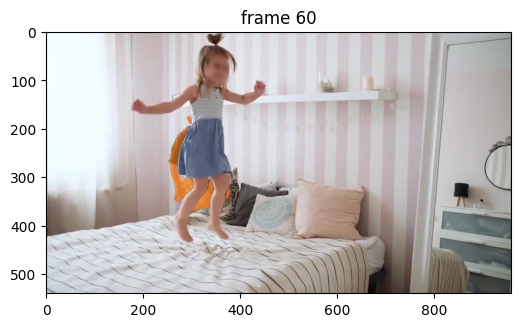

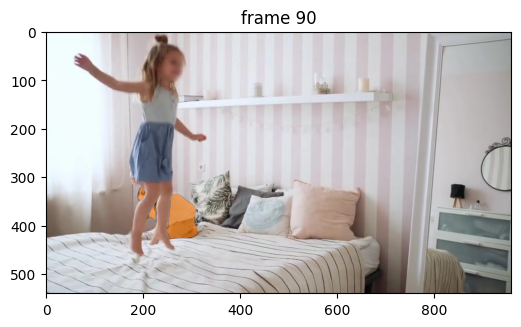

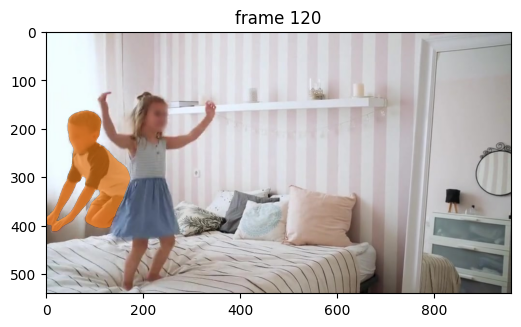

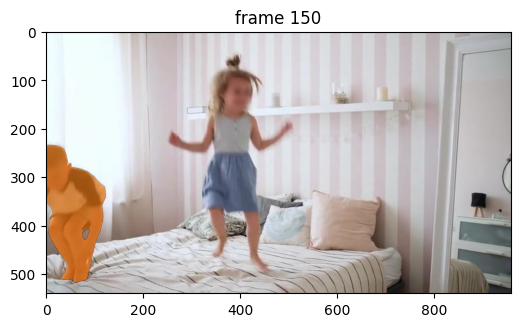

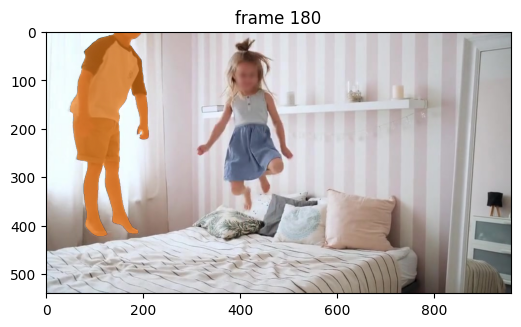

In [14]:
# 在整个视频中运行传播，并将结果收集到一个字典中
video_segments = {}  # video_segments 包含逐帧的分割结果
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# 每隔几帧渲染一次分割结果
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

The segments now look good on all frames.

现在所有帧上的分割效果都很好。

### Example 2: Segment an object using box prompt

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

注意：如果您之前已经使用过此 inference_state 进行任何跟踪，请先通过 reset_state 重置它。

In [15]:
predictor.reset_state(inference_state)

In addition to using clicks as inputs, SAM 2 also supports segmenting and tracking objects in a video via **bounding boxes**.

In the example below, we segment the child on the right using a **box prompt** of (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) on frame 0 as input into the `add_new_points_or_box` API.

除了使用点击作为输入，SAM 2 还支持通过边界框对视频中的对象进行分割和跟踪。

在下面的示例中，我们使用在帧 0 上的框提示 (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) 来分割右侧的孩子，将其作为输入传递给 add_new_points_or_box API。

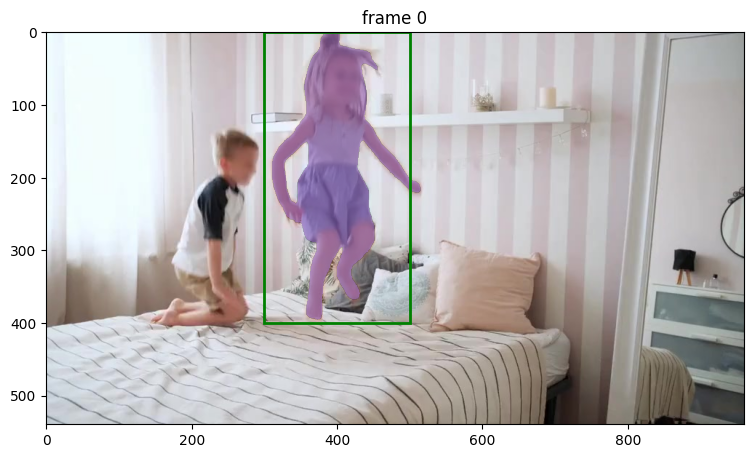

In [16]:
ann_frame_idx = 0  # 我们进行交互的帧索引
ann_obj_id = 4  # 为我们进行交互的每个对象分配一个唯一的 ID（可以是任意整数）

# 现在在 (x_min, y_min, x_max, y_max) = (300, 0, 500, 400) 位置添加一个框以开始
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    box=box,
)

# 在当前（交互的）帧上显示结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Here, SAM 2 gets a pretty good segmentation mask of the entire child, even though the input bounding box is not perfectly tight around the object.

Similar to the previous example, if the returned mask from is not perfect when using a box prompt, we can also further **refine** the output using positive or negative clicks. To illustrate this, here we make a **positive click** at (x, y) = (460, 60) with label `1` to expand the segment around the child's hair.

Note: to refine the segmentation mask from a box prompt, we need to send **both the original box input and all subsequent refinement clicks and their labels** when calling `add_new_points_or_box`.

在这里，尽管输入的边界框没有完全紧贴对象，但 SAM 2 仍然能够获得相当好的整个孩子的分割掩码。

与之前的示例类似，如果使用边界框提示返回的掩码不完美，我们也可以通过正向或负向点击进一步细化输出。为说明这一点，我们在 (x, y) = (460, 60) 位置进行一次正向点击，标签为 1，以扩展孩子头发周围的分割区域。

注意：要从边界框提示中细化分割掩码，我们需要在调用 add_new_points_or_box 时传递原始框输入和所有后续细化点击及其标签。

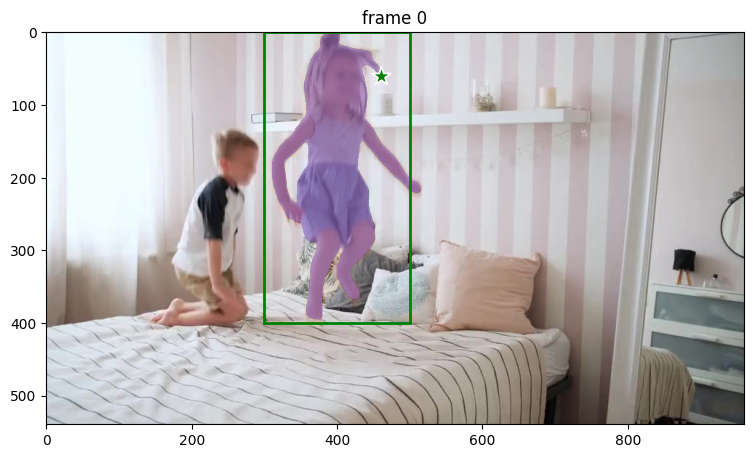

In [17]:
ann_frame_idx = 0  # 我们进行交互的帧索引
ann_obj_id = 4  # 为我们进行交互的每个对象分配一个唯一的 ID（可以是任意整数）

# 现在在 (x, y) = (460, 60) 位置添加一次正向点击以细化分割
points = np.array([[460, 60]], dtype=np.float32)
# 对于标签，`1` 表示正向点击，`0` 表示负向点击
labels = np.array([1], np.int32)
# 注意我们还需要将原始框输入和新的细化点击一起发送到 `add_new_points_or_box`
box = np.array([300, 0, 500, 400], dtype=np.float32)
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
    box=box,
)

# 在当前（交互的）帧上显示结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_box(box, plt.gca())
show_points(points, labels, plt.gca())
show_mask((out_mask_logits[0] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_ids[0])

Then, to get the masklet throughout the entire video, we propagate the prompts using the `propagate_in_video` API.

然后，为了在整个视频中获取时空掩码，我们使用 propagate_in_video API 传播提示。

propagate in video: 100%|██████████| 200/200 [00:08<00:00, 23.82it/s]


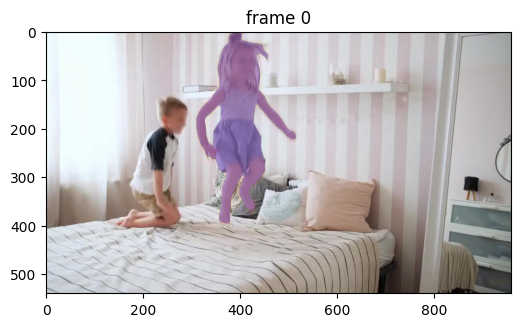

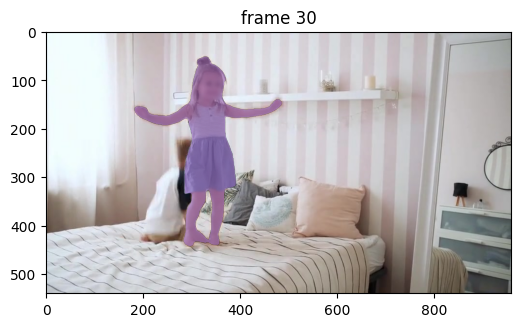

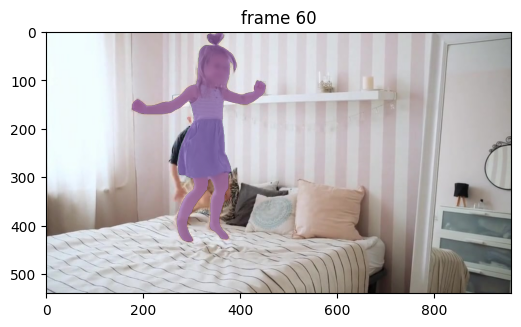

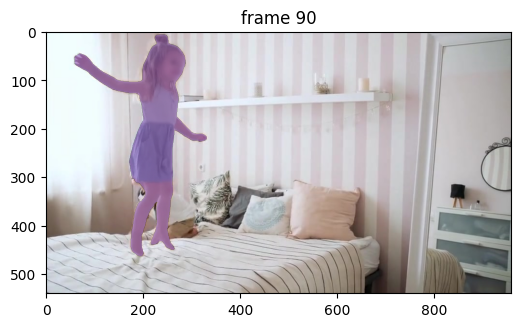

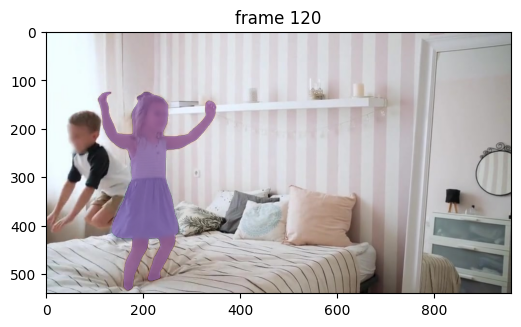

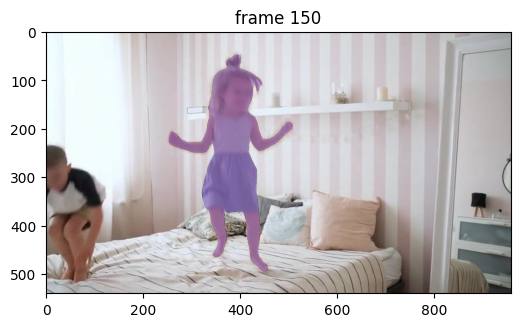

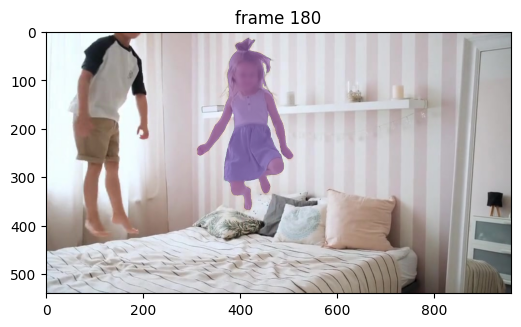

In [18]:
# 在整个视频中运行传播并将结果收集到一个字典中
video_segments = {}  # video_segments 包含每帧的分割结果
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# 每隔几帧渲染分割结果
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Note that in addition to clicks or boxes, SAM 2 also supports directly using a **mask prompt** as input via the `add_new_mask` method in the `SAM2VideoPredictor` class. This can be helpful in e.g. semi-supervised VOS evaluations (see [tools/vos_inference.py](https://github.com/facebookresearch/segment-anything-2/blob/main/tools/vos_inference.py) for an example).

注意，除了点击或框，SAM 2 还支持通过 `SAM2VideoPredictor` 类中的 `add_new_mask` 方法直接使用**掩码提示**作为输入。这在例如半监督 VOS 评估中可能会很有帮助（有关示例，请参见 [tools/vos_inference.py](https://github.com/facebookresearch/segment-anything-2/blob/main/tools/vos_inference.py)）。

### Example 3: Segment multiple objects simultaneously

Note: if you have run any previous tracking using this `inference_state`, please reset it first via `reset_state`.

注意：如果您之前已经使用过此 inference_state 进行任何跟踪，请先通过 reset_state 重置它。

In [19]:
predictor.reset_state(inference_state)

#### Step 1: Add two objects on a frame

SAM 2 can also segment and track two or more objects at the same time. One way, of course, is to do them one by one. However, it would be more efficient to batch them together (e.g. so that we can share the image features between objects to reduce computation costs).

This time, let's focus on object parts and segment **the shirts of both childen** in this video. Here we add prompts for these two objects and assign each of them a unique object id.

SAM 2 也可以同时分割和跟踪两个或更多对象。一个方法当然是逐个处理。然而，将它们批量处理会更高效（例如，这样我们可以在对象之间共享图像特征以减少计算成本）。

这一次，我们集中于对象的部分，分割两个孩子的衬衫。在这里，我们为这两个对象添加提示，并为每个对象分配一个唯一的对象 ID。

In [21]:
prompts = {}  # 保存所有添加的点击用于可视化

Add the first object (the left child's shirt) with a **positive click** at (x, y) = (200, 300) on frame 0.

We assign it to object id `2` (it can be arbitrary integers, and only needs to be unique for each object to track), which is passed to the `add_new_points_or_box` API to distinguish the object we are clicking upon.

在帧 0 上的 (x, y) = (200, 300) 位置，使用一次**正向点击**添加第一个对象（左侧孩子的衬衫）。

我们将其分配给对象 ID `2`（可以是任意整数，只需对每个对象唯一以进行跟踪），该 ID 通过 `add_new_points_or_box` API 传递，以区分我们点击的对象。

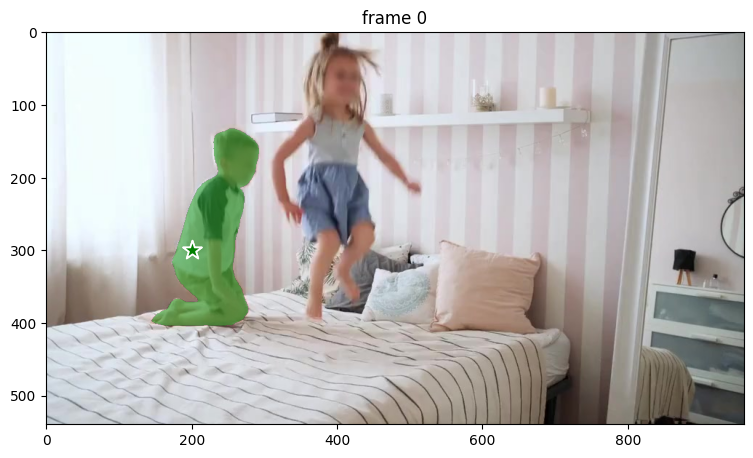

In [22]:
ann_frame_idx = 0  # 交互的帧索引
ann_obj_id = 2  # 为每个交互的对象分配一个唯一的 ID（可以是任何整数）

# 在第一个对象上添加一个正点击，位置为 (x, y) = (200, 300) 以开始
points = np.array([[200, 300]], dtype=np.float32)
# 对于标签，`1` 表示正点击，`0` 表示负点击
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# 显示当前（交互的）帧上的结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

Hmm, this time we just want to select the child's shirt, but the model predicts the mask for the entire child. Let's refine the prediction with a **negative click** at (x, y) = (275, 175).

嗯，这一次我们只是想选择孩子的衬衫，但模型预测了整个孩子的掩码。我们可以通过在 (x, y) = (275, 175) 位置进行一次负向点击来细化预测结果。

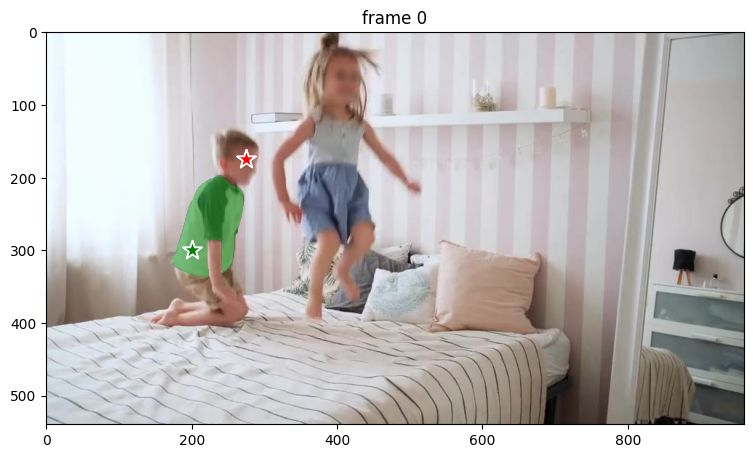

In [23]:
# 添加第一个对象
ann_frame_idx = 0   # 交互的帧索引
ann_obj_id = 2   # 为每个交互的对象分配一个唯一的 ID（可以是任何整数）

# 在第一个对象上添加第二个负点击，位置为 (x, y) = (275, 175) 以进一步优化
# 将所有点击及其标签一起发送到 `add_new_points_or_box`
points = np.array([[200, 300], [275, 175]], dtype=np.float32)
# 对于标签，`1` 表示正点击，`0` 表示负点击
labels = np.array([1, 0], np.int32)
prompts[ann_obj_id] = points, labels
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# 显示当前（交互的）帧上的结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

After the 2nd negative click, now we get the left child's shirt as our first object.

Let's move on to the second object (the right child's shirt) with a positive click at (x, y) = (400, 150) on frame 0. Here we assign object id `3` to this second object (it can be arbitrary integers, and only needs to be unique for each object to track).

Note: when there are multiple objects, the `add_new_points_or_box` API will return a list of masks for each object.

在第二次负向点击之后，我们现在获得了左侧孩子的衬衫作为第一个对象。

接下来，我们为第二个对象（右侧孩子的衬衫）在帧 0 上的 (x, y) = (400, 150) 位置进行一次正向点击。在这里，我们将对象 ID 3 分配给这个第二个对象（可以是任意整数，只需对每个对象唯一以进行跟踪）。

注意：当有多个对象时，add_new_points_or_box API 将返回一个包含每个对象掩码的列表。

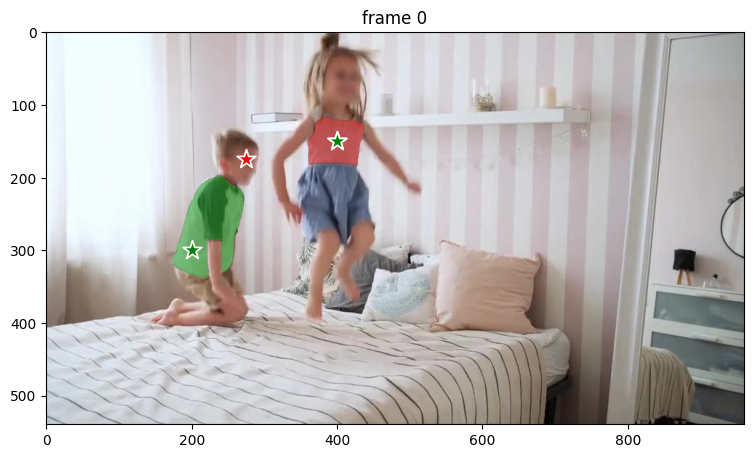

In [24]:
# 添加第二个对象
ann_frame_idx = 0  # 交互的帧索引
ann_obj_id = 3  # 为每个交互的对象分配一个唯一的 ID（可以是任何整数）

# 现在我们来处理第二个我们想跟踪的对象（分配 ID 为 `3`）
# 在位置 (x, y) = (400, 150) 添加一个正点击
points = np.array([[400, 150]], dtype=np.float32)
# 对于标签，`1` 表示正点击，`0` 表示负点击
labels = np.array([1], np.int32)
prompts[ann_obj_id] = points, labels

# `add_new_points_or_box` 返回所有添加的对象在当前帧上的掩码
_, out_obj_ids, out_mask_logits = predictor.add_new_points_or_box(
    inference_state=inference_state,
    frame_idx=ann_frame_idx,
    obj_id=ann_obj_id,
    points=points,
    labels=labels,
)

# 显示当前（交互的）帧上所有对象的结果
plt.figure(figsize=(9, 6))
plt.title(f"frame {ann_frame_idx}")
plt.imshow(Image.open(os.path.join(video_dir, frame_names[ann_frame_idx])))
show_points(points, labels, plt.gca())
for i, out_obj_id in enumerate(out_obj_ids):
    show_points(*prompts[out_obj_id], plt.gca())
    show_mask((out_mask_logits[i] > 0.0).cpu().numpy(), plt.gca(), obj_id=out_obj_id)

This time the model predicts the mask of the shirt we want to track in just one click. Nice!

这一次，模型在仅仅一次点击后就准确地预测了我们想要跟踪的衬衫的掩码。很好！

#### Step 2: Propagate the prompts to get masklets across the video

Now, we propagate the prompts for both objects to get their masklets throughout the video.

Note: when there are multiple objects, the `propagate_in_video` API will return a list of masks for each object.

现在，我们传播这两个对象的提示，以获取它们在整个视频中的时空掩码。

注意：当有多个对象时，propagate_in_video API 将返回一个包含每个对象掩码的列表。

propagate in video: 100%|██████████| 200/200 [00:09<00:00, 20.92it/s]


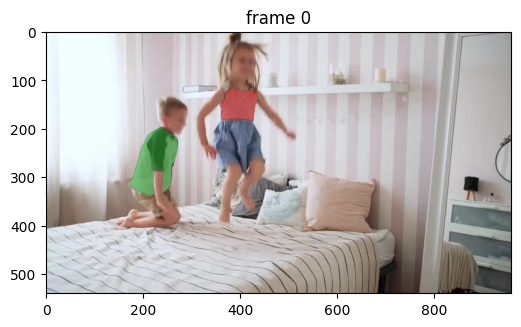

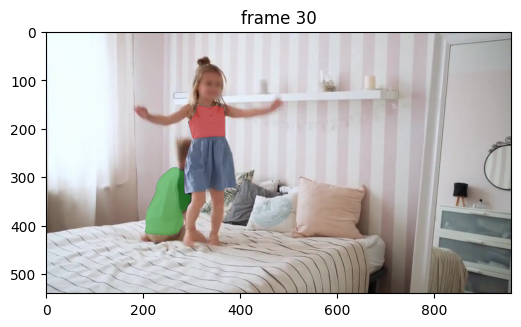

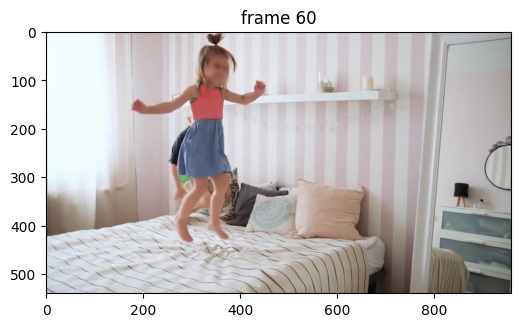

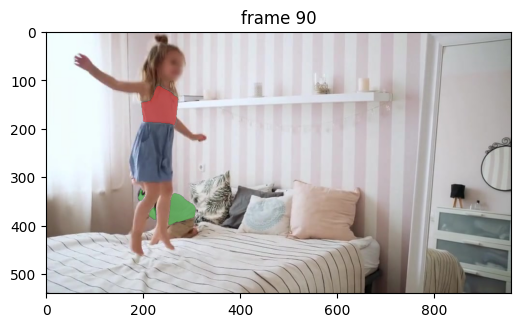

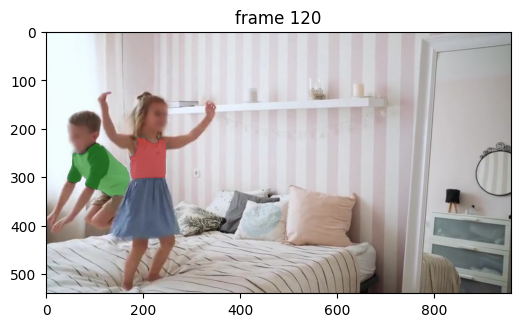

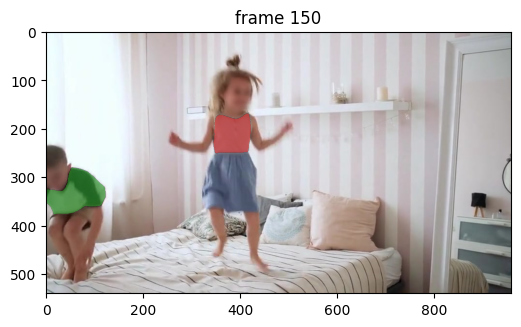

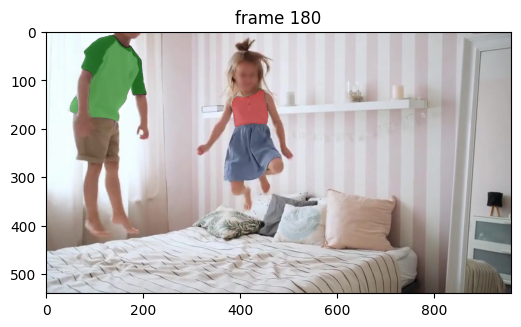

In [25]:
# 在视频中运行传播并将结果收集到一个字典中
video_segments = {}  # video_segments 包含每帧的分割结果
for out_frame_idx, out_obj_ids, out_mask_logits in predictor.propagate_in_video(inference_state):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

# 每隔几帧渲染分割结果
vis_frame_stride = 30
plt.close("all")
for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(video_dir, frame_names[out_frame_idx])))
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

Looks like both children's shirts are well segmented in this video.

Now you can try SAM 2 on your own videos and use cases! 

看起来这段视频中两个孩子的衬衫都被很好地分割了。

现在您可以在自己的视频和用例中尝试使用 SAM 2 了！